In [15]:
!pip install bertviz

In [16]:
import bertviz


In [17]:
from bertviz.transformers_neuron_view import BertModel, BertTokenizer
from bertviz.neuron_view import show

In [18]:
sentence_a = "The artist painted the portrait of a woman with a brush"


In [19]:
model_type = 'bert'
model_version = 'bert-base-uncased'

In [20]:
model = BertModel.from_pretrained(model_version, output_attentions=True)
tokenizer = BertTokenizer.from_pretrained(model_version, do_lower_case=True)
show(model, model_type, tokenizer, sentence_a, layer=4, head=3)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [21]:
import torch 
import matplotlib.pyplot as plt
from bertviz.neuron_view import show

In [22]:
from transformers import BertTokenizer, BertModel


In [23]:
sentence = "The artist painted the portrait of a woman with a brush"


In [25]:
model_type = 'bert'
model_name = 'bert-base-uncased'

In [26]:
tokenizer = BertTokenizer.from_pretrained(model_name)
model = BertModel.from_pretrained(model_name, output_attentions=True)


Loading weights: 100%|██████████| 199/199 [00:00<00:00, 306.56it/s, Materializing param=pooler.dense.weight]                               
BertModel LOAD REPORT from: bert-base-uncased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


In [27]:
# Tokenize the input sentence
inputs = tokenizer(sentence, return_tensors='pt')
tokens = tokenizer.tokenize(sentence)
tokens = ['[CLS]'] + tokens + ['[SEP]']  # Add special tokens


In [28]:
woman_index = tokens.index('woman')


In [32]:
print(woman_index)

8


In [29]:
# Forward pass to get outputs and attention weights
outputs = model(**inputs, output_attentions=True)
attentions = outputs.attentions  # List of attention layers (one for each layer)


In [30]:
# Function to visualize the attention for the token "woman"
def visualize_attention_for_woman(layer_idx, head_idx):
    # Get attention weights for the given layer and head
    attention_weights = attentions[layer_idx][0, head_idx].detach().numpy()

    # Get the attention values where "woman" is attending to other tokens
    woman_attention = attention_weights[woman_index]

    # Plot the attention map for the "woman" token
    plt.figure(figsize=(10, 8))
    plt.bar(tokens, woman_attention)
    plt.xticks(rotation=90)
    plt.ylabel('Attention Weight')
    plt.title(f'Attention of "woman" (Layer {layer_idx}, Head {head_idx})')
    plt.show()

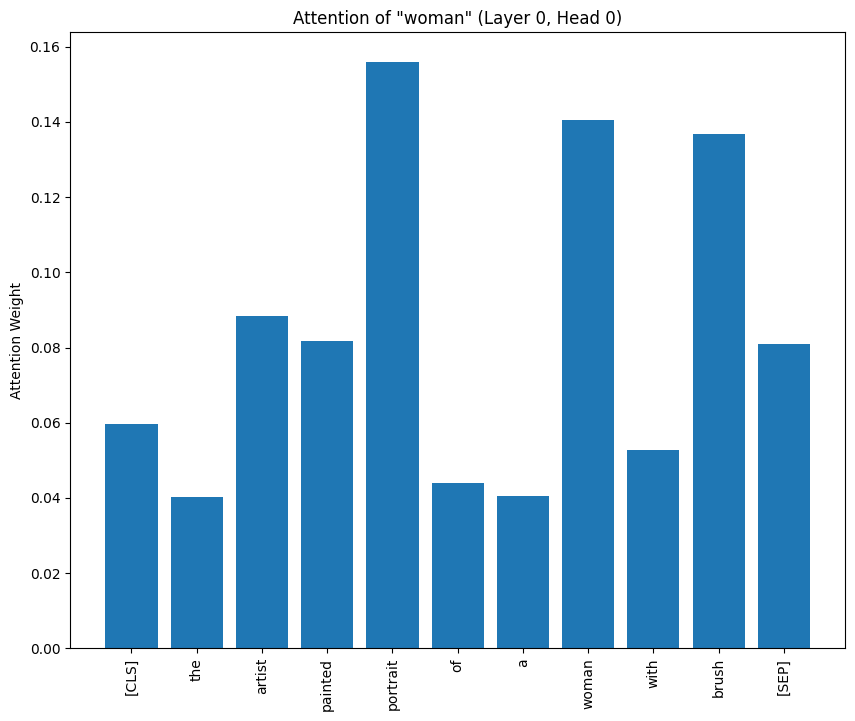

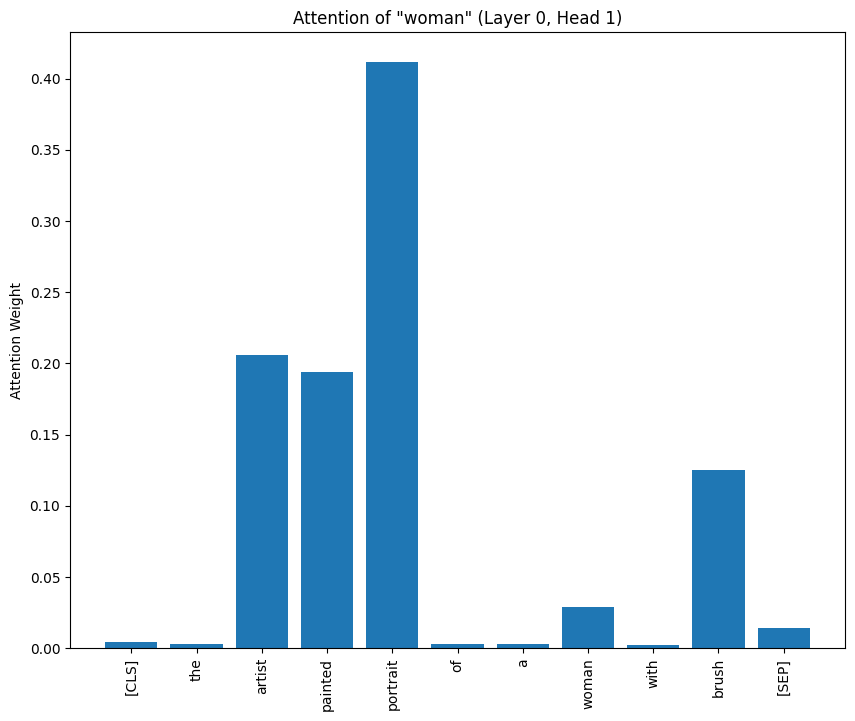

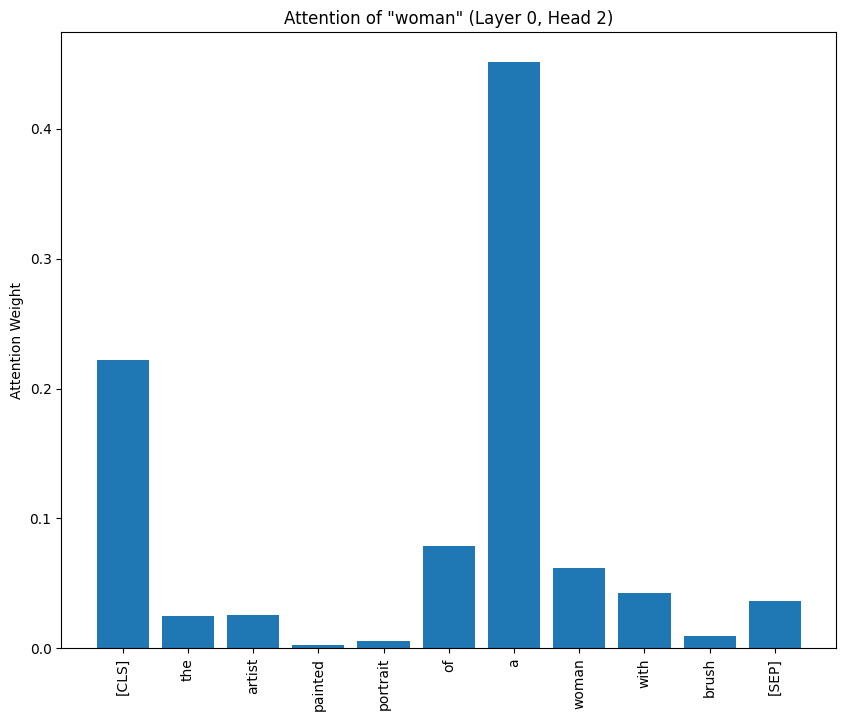

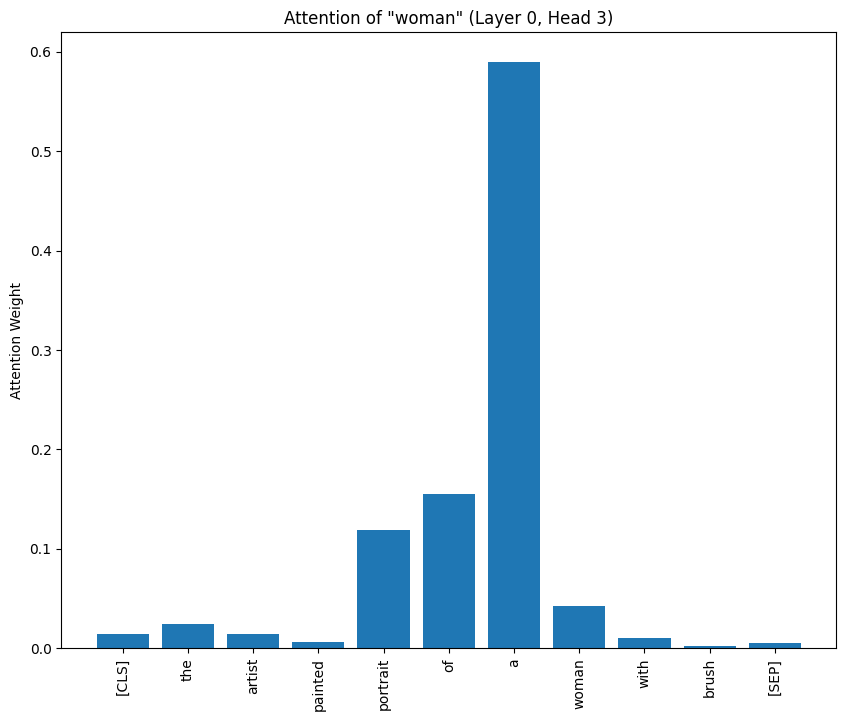

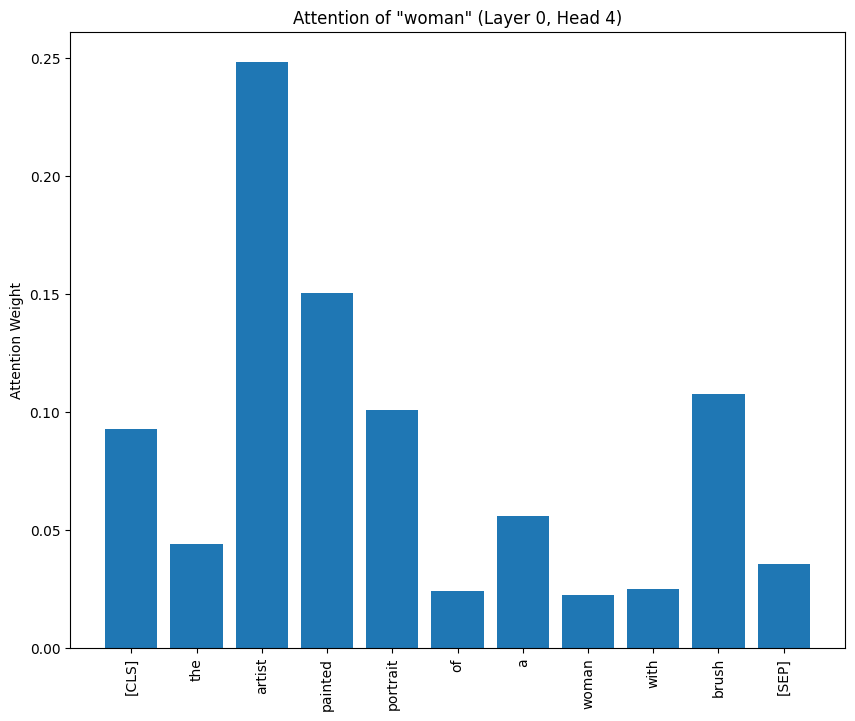

...

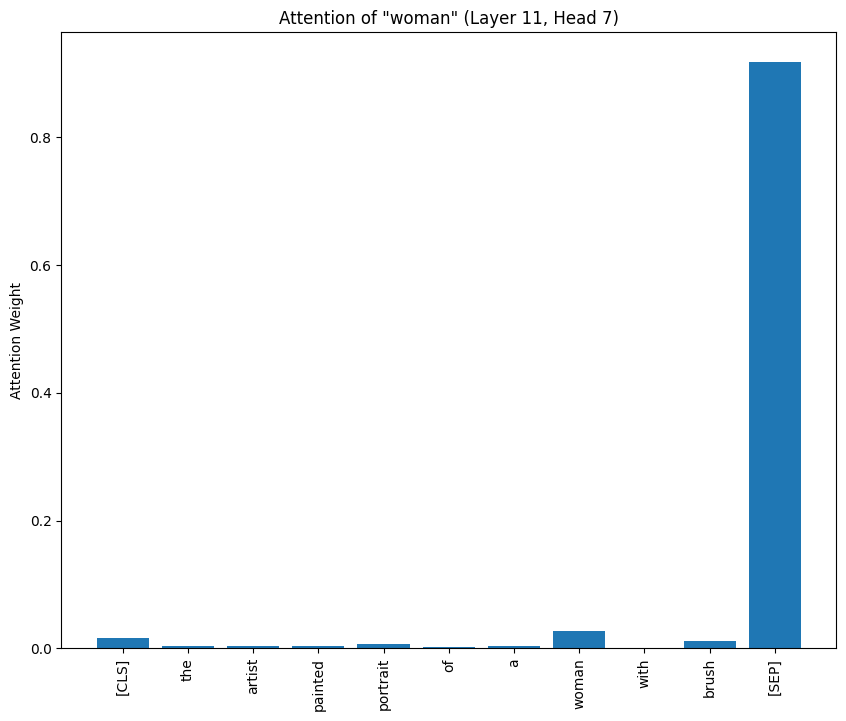

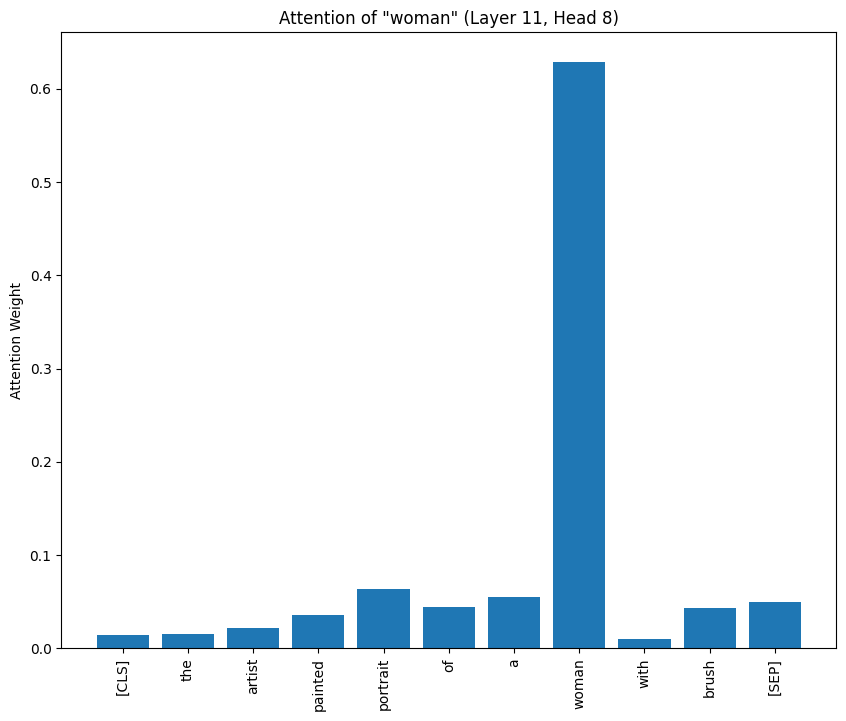

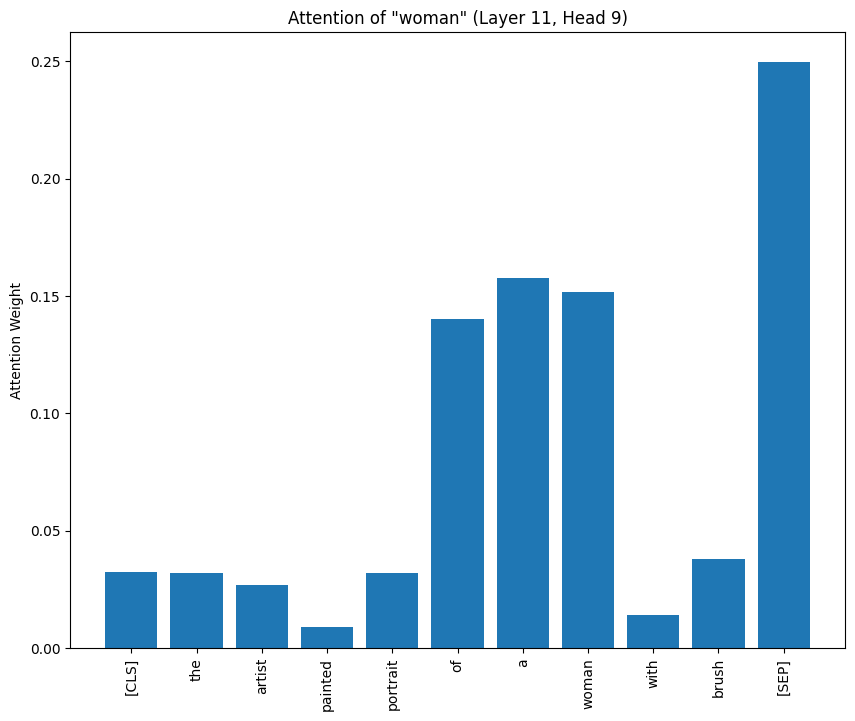

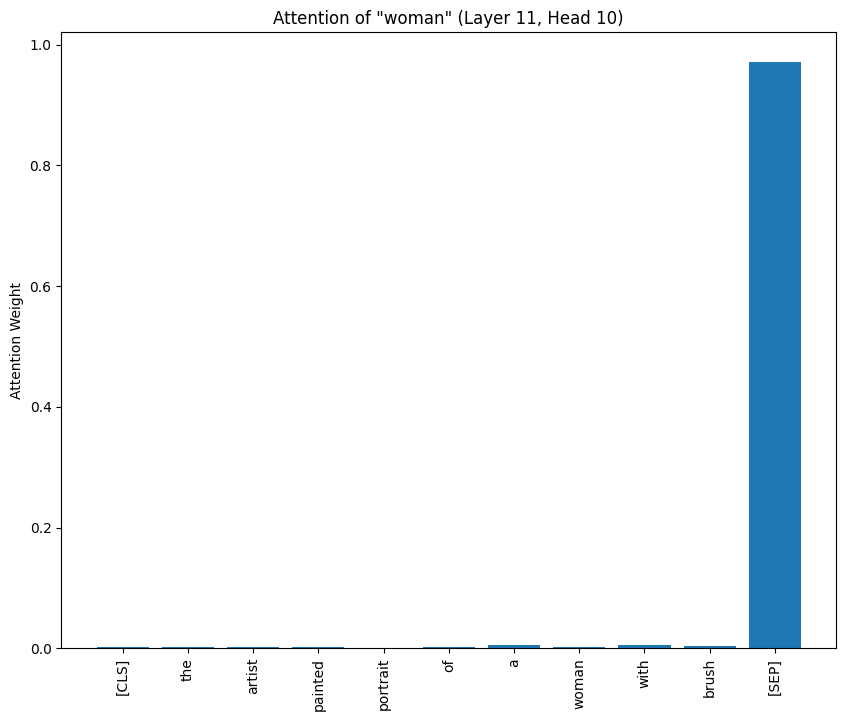

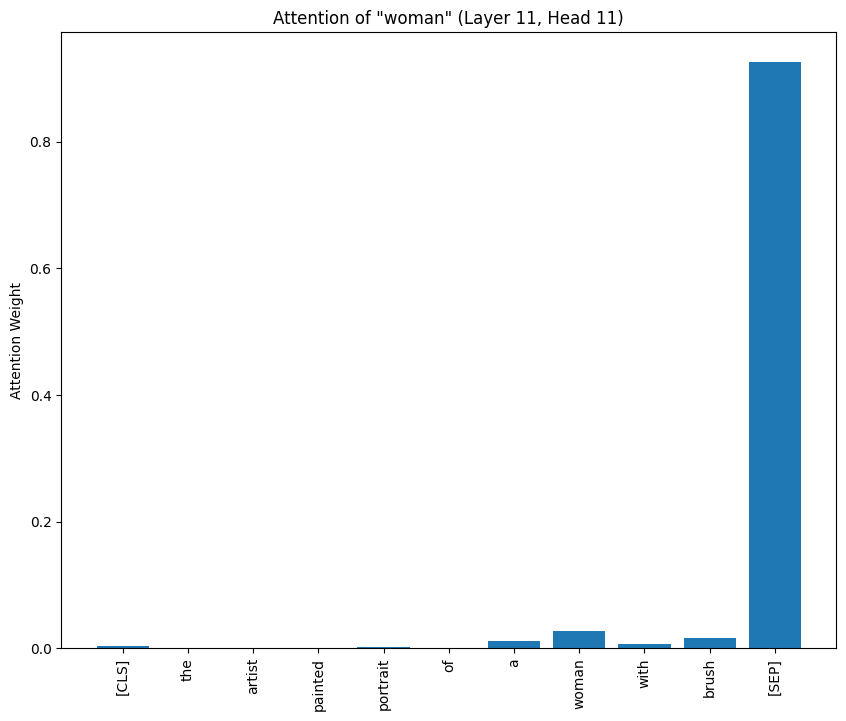

In [31]:
# Iterate over all layers and heads to visualize the attention of "woman"
for layer_idx in range(len(attentions)):  # Loop through each layer
    for head_idx in range(attentions[layer_idx].size(1)):  # Loop through each head in the layer
        visualize_attention_for_woman(layer_idx, head_idx)